In [5]:
# Initial imports
import pandas as pd
from pathlib import Path
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
%matplotlib inline

In [6]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
import tensorflow as tf

In [28]:
!pip install imblearn # install the imblearn library
from imblearn.over_sampling import RandomOverSampler

In [12]:
white_wine = pd.read_csv('winequality-white.csv', sep=';')
white_wine.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


In [13]:
white_wine.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4898 entries, 0 to 4897
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         4898 non-null   float64
 1   volatile acidity      4898 non-null   float64
 2   citric acid           4898 non-null   float64
 3   residual sugar        4898 non-null   float64
 4   chlorides             4898 non-null   float64
 5   free sulfur dioxide   4898 non-null   float64
 6   total sulfur dioxide  4898 non-null   float64
 7   density               4898 non-null   float64
 8   pH                    4898 non-null   float64
 9   sulphates             4898 non-null   float64
 10  alcohol               4898 non-null   float64
 11  quality               4898 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 459.3 KB


In [15]:
white_wine['quality'].value_counts()

,count
quality,
6,2198
5,1457
7,880
8,175
4,163
3,20
9,5


In [16]:
# Define a function to categorize the quality
def categorize_quality(quality):
    if 1 <= quality <= 3:
        return '0'
    elif 4 <= quality <= 6:
        return '1'
    elif 7 <= quality <= 9:
        return '2'

# Apply the function to create the 'quality_category' column
white_wine['quality_category'] = white_wine['quality'].apply(categorize_quality)

# Display the first few rows of the DataFrame to verify the changes
white_wine.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,quality_category
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6,1
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6,1
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6,1
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6,1
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6,1


In [135]:
white_wine.drop('quality', axis=1)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality_category
0,7.00,0.270,0.36,20.70,0.045,45.0,170.0,1.001000,3.00,0.45,8.800000,1
1,6.30,0.300,0.34,1.60,0.049,14.0,132.0,0.994000,3.30,0.49,9.500000,1
2,8.10,0.280,0.40,6.90,0.050,30.0,97.0,0.995100,3.26,0.44,10.100000,1
3,7.20,0.230,0.32,8.50,0.058,47.0,186.0,0.995600,3.19,0.40,9.900000,1
4,7.20,0.230,0.32,8.50,0.058,47.0,186.0,0.995600,3.19,0.40,9.900000,1
5,8.10,0.280,0.40,6.90,0.050,30.0,97.0,0.995100,3.26,0.44,10.100000,1
6,6.20,0.320,0.16,7.00,0.045,30.0,136.0,0.994900,3.18,0.47,9.600000,1
7,7.00,0.270,0.36,20.70,0.045,45.0,170.0,1.001000,3.00,0.45,8.800000,1
8,6.30,0.300,0.34,1.60,0.049,14.0,132.0,0.994000,3.30,0.49,9.500000,1
9,8.10,0.220,0.43,1.50,0.044,28.0,129.0,0.993800,3.22,0.45,11.000000,1


In [136]:
white_wine['quality_category'].value_counts()

,count
quality_category,
1,3818
2,1060
0,20


In [137]:
# Remove quality target from features data
y = white_wine.quality_category.values
X = white_wine.drop(columns="quality_category").values

# Split training/test datasets
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, stratify=y)

In [138]:
# Apply Random Oversampling
ros = RandomOverSampler(random_state=42)
X_resampled, y_resampled = ros.fit_resample(X, y)

# Check the new class distribution
print(pd.Series(y_resampled).value_counts())

1    3818
2    3818
0    3818
Name: count, dtype: int64


In [139]:
# Preprocess numerical data for neural network

# Create a StandardScaler instances
scaler = StandardScaler()

# Fit the StandardScaler
X_scaler = scaler.fit(X_train)

# Scale the data
X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

# Print the shape of the scaled data to check for inconsistencies
print(X_train_scaled.shape) # Add this line to check the shape

(3673, 12)


In [140]:
# Define the deep learning model
nn_model = tf.keras.models.Sequential()
nn_model.add(tf.keras.layers.Dense(units=16, activation="relu", input_dim=12))
nn_model.add(tf.keras.layers.Dense(units=16, activation="relu"))
nn_model.add(tf.keras.layers.Dense(units=3, activation="softmax")) # Changed output layer units to 3 to match the number of unique values in the target variable

# Compile the Sequential model together and customize metrics
nn_model.compile(loss="categorical_crossentropy", optimizer="adam", metrics=["accuracy"]) # Use categorical_crossentropy

# Convert y_train to categorical
y_train_categorical = tf.keras.utils.to_categorical(y_train)

# Train the model
fit_model = nn_model.fit(X_train_scaled, y_train_categorical, epochs=50)

Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


115/115 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5797 - loss: 0.9167
Epoch 2/50
115/115 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8059 - loss: 0.4533
Epoch 3/50
115/115 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9387 - loss: 0.2681
Epoch 4/50
115/115 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9814 - loss: 0.1728
Epoch 5/50
115/115 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9948 - loss: 0.0875
Epoch 6/50
115/115 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9963 - loss: 0.0649
Epoch 7/50
115/115 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9944 - loss: 0.0673
Epoch 8/50
115/115 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9951 - loss: 0.0532
Epoch 9/50
115/115 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9977 - loss: 0.0273
Epoch 10/50
115/115 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9958 - loss: 0.0341
Epoch 11/50
115/115 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9957 - loss: 0.0313
Epoch 12/50
115/115 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy

In [141]:
# Evaluate the model using the test data
model_loss, model_accuracy = nn_model.evaluate(X_test_scaled,  tf.keras.utils.to_categorical(y_test), verbose=2) # One-hot encode y_test
print(f"Loss: {model_loss}, Accuracy: {model_accuracy}")

39/39 - 0s - 5ms/step - accuracy: 0.9976 - loss: 0.0155
Loss: 0.015487316064536572, Accuracy: 0.9975510239601135


In [33]:
red_wine = pd.read_csv('winequality-red.csv', sep=';')
red_wine.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [34]:
red_wine.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


In [35]:
red_wine['quality'].value_counts()

,count
quality,
5,681
6,638
7,199
4,53
8,18
3,10


In [36]:
# Define a function to categorize the quality
def categorize_quality(quality):
    if 1 <= quality <= 3:
        return '0'
    elif 4 <= quality <= 6:
        return '1'
    elif 7 <= quality <= 9:
        return '2'

# Apply the function to create the 'quality_category' column
red_wine['quality_category'] = white_wine['quality'].apply(categorize_quality)

# Display the first few rows of the DataFrame to verify the changes
red_wine.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,quality_category
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,1
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,1
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,1
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,1
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,1


In [40]:
# Remove quality target from features data
y = red_wine.quality_category.values
X = red_wine.drop(columns="quality_category").values

# Split training/test datasets
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, stratify=y)

In [42]:
# Apply Random Oversampling
ros = RandomOverSampler(random_state=42)
X_resampled, y_resampled = ros.fit_resample(X, y)

# Check the new class distribution
print(pd.Series(y_resampled).value_counts())

1    1224
2    1224
0    1224
Name: count, dtype: int64


In [43]:
# Preprocess numerical data for neural network

# Create a StandardScaler instances
scaler = StandardScaler()

# Fit the StandardScaler
X_scaler = scaler.fit(X_train)

# Scale the data
X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

# Print the shape of the scaled data to check for inconsistencies
print(X_train_scaled.shape) # Add this line to check the shape

(1199, 12)


In [44]:
# Define the deep learning model
nn_model = tf.keras.models.Sequential()
nn_model.add(tf.keras.layers.Dense(units=16, activation="relu", input_dim=12))
nn_model.add(tf.keras.layers.Dense(units=16, activation="relu"))
nn_model.add(tf.keras.layers.Dense(units=3, activation="softmax")) # Changed output layer units to 3 to match the number of unique values in the target variable

# Compile the Sequential model together and customize metrics
nn_model.compile(loss="categorical_crossentropy", optimizer="adam", metrics=["accuracy"]) # Use categorical_crossentropy

# Convert y_train to categorical
y_train_categorical = tf.keras.utils.to_categorical(y_train)

# Train the model
fit_model = nn_model.fit(X_train_scaled, y_train_categorical, epochs=50)

Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5689 - loss: 0.9833
Epoch 2/50
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7257 - loss: 0.7750
Epoch 3/50
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7573 - loss: 0.6848
Epoch 4/50
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7908 - loss: 0.6024
Epoch 5/50
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7737 - loss: 0.5985
Epoch 6/50
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7716 - loss: 0.5733
Epoch 7/50
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7532 - loss: 0.6017
Epoch 8/50
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7536 - loss: 0.5885
Epoch 9/50
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7899 - loss: 0.5445
Epoch 10/50
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7643 - loss: 0.5530
Epoch 11/50
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7667 - loss: 0.5613
Epoch 12/50
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7807 - loss: 0.5412


In [45]:
# Evaluate the model using the test data
model_loss, model_accuracy = nn_model.evaluate(X_test_scaled,  tf.keras.utils.to_categorical(y_test), verbose=2) # One-hot encode y_test
print(f"Loss: {model_loss}, Accuracy: {model_accuracy}")

13/13 - 0s - 15ms/step - accuracy: 0.7500 - loss: 0.6183
Loss: 0.6182871460914612, Accuracy: 0.75


In [46]:
combined_df = pd.concat([white_wine, red_wine], ignore_index=True)
combined_df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,quality_category
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6,1
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6,1
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6,1
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6,1
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6,1


In [47]:
combined_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6497 entries, 0 to 6496
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         6497 non-null   float64
 1   volatile acidity      6497 non-null   float64
 2   citric acid           6497 non-null   float64
 3   residual sugar        6497 non-null   float64
 4   chlorides             6497 non-null   float64
 5   free sulfur dioxide   6497 non-null   float64
 6   total sulfur dioxide  6497 non-null   float64
 7   density               6497 non-null   float64
 8   pH                    6497 non-null   float64
 9   sulphates             6497 non-null   float64
 10  alcohol               6497 non-null   float64
 11  quality               6497 non-null   int64  
 12  quality_category      6497 non-null   object 
dtypes: float64(11), int64(1), object(1)
memory usage: 660.0+ KB


In [48]:
combined_df['quality'].value_counts()

,count
quality,
6,2836
5,2138
7,1079
4,216
8,193
3,30
9,5


In [49]:
# Define a function to categorize the quality
def categorize_quality(quality):
    if 1 <= quality <= 3:
        return '0'
    elif 4 <= quality <= 6:
        return '1'
    elif 7 <= quality <= 9:
        return '2'

# Apply the function to create the 'quality_category' column
red_wine['quality_category'] = white_wine['quality'].apply(categorize_quality)

# Display the first few rows of the DataFrame to verify the changes
red_wine.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,quality_category
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,1
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,1
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,1
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,1
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,1


In [50]:
# Remove quality target from features data
y = combined_df.quality_category.values
X = combined_df.drop(columns="quality_category").values

# Split training/test datasets
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, stratify=y)

In [51]:
# Apply Random Oversampling
ros = RandomOverSampler(random_state=42)
X_resampled, y_resampled = ros.fit_resample(X, y)

# Check the new class distribution
print(pd.Series(y_resampled).value_counts())

1    5042
2    5042
0    5042
Name: count, dtype: int64


In [52]:
# Preprocess numerical data for neural network

# Create a StandardScaler instances
scaler = StandardScaler()

# Fit the StandardScaler
X_scaler = scaler.fit(X_train)

# Scale the data
X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

# Print the shape of the scaled data to check for inconsistencies
print(X_train_scaled.shape) # Add this line to check the shape

(4872, 12)


In [53]:
# Define the deep learning model
nn_model = tf.keras.models.Sequential()
nn_model.add(tf.keras.layers.Dense(units=16, activation="relu", input_dim=12))
nn_model.add(tf.keras.layers.Dense(units=16, activation="relu"))
nn_model.add(tf.keras.layers.Dense(units=3, activation="softmax")) # Changed output layer units to 3 to match the number of unique values in the target variable

# Compile the Sequential model together and customize metrics
nn_model.compile(loss="categorical_crossentropy", optimizer="adam", metrics=["accuracy"]) # Use categorical_crossentropy

# Convert y_train to categorical
y_train_categorical = tf.keras.utils.to_categorical(y_train)

# Train the model
fit_model = nn_model.fit(X_train_scaled, y_train_categorical, epochs=50)

Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


153/153 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3348 - loss: 1.2830
Epoch 2/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8415 - loss: 0.4869
Epoch 3/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8983 - loss: 0.3412
Epoch 4/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9270 - loss: 0.2576
Epoch 5/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9322 - loss: 0.2244
Epoch 6/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9313 - loss: 0.2118
Epoch 7/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9354 - loss: 0.1878
Epoch 8/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9388 - loss: 0.1716
Epoch 9/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9407 - loss: 0.1717
Epoch 10/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9338 - loss: 0.1720
Epoch 11/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9365 - loss: 0.1668
Epoch 12/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy

In [54]:
# Evaluate the model using the test data
model_loss, model_accuracy = nn_model.evaluate(X_test_scaled,  tf.keras.utils.to_categorical(y_test), verbose=2) # One-hot encode y_test
print(f"Loss: {model_loss}, Accuracy: {model_accuracy}")

51/51 - 0s - 5ms/step - accuracy: 0.9415 - loss: 0.1556
Loss: 0.15556824207305908, Accuracy: 0.9415384531021118


In [144]:
combined_df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,quality_category
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6,1
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6,1
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6,1
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6,1
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6,1


In [145]:
combined_df.drop('quality_category', axis=1)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.00,0.270,0.36,20.70,0.045,45.0,170.0,1.001000,3.00,0.45,8.800000,6
1,6.30,0.300,0.34,1.60,0.049,14.0,132.0,0.994000,3.30,0.49,9.500000,6
2,8.10,0.280,0.40,6.90,0.050,30.0,97.0,0.995100,3.26,0.44,10.100000,6
3,7.20,0.230,0.32,8.50,0.058,47.0,186.0,0.995600,3.19,0.40,9.900000,6
4,7.20,0.230,0.32,8.50,0.058,47.0,186.0,0.995600,3.19,0.40,9.900000,6
5,8.10,0.280,0.40,6.90,0.050,30.0,97.0,0.995100,3.26,0.44,10.100000,6
6,6.20,0.320,0.16,7.00,0.045,30.0,136.0,0.994900,3.18,0.47,9.600000,6
7,7.00,0.270,0.36,20.70,0.045,45.0,170.0,1.001000,3.00,0.45,8.800000,6
8,6.30,0.300,0.34,1.60,0.049,14.0,132.0,0.994000,3.30,0.49,9.500000,6
9,8.10,0.220,0.43,1.50,0.044,28.0,129.0,0.993800,3.22,0.45,11.000000,6


In [148]:
# Define features set
finalDF = combined_df.drop('quality_category', axis=1)
X = finalDF.copy()
X.drop("quality", axis=1, inplace=True)
X.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9


In [149]:
# Define target vector
y = combined_df["quality"].ravel()
y[:5]

array([6, 6, 6, 6, 6])

In [150]:
combined_df['quality'].value_counts()

,count
quality,
6,2836
5,2138
7,1079
4,216
8,193
3,30
9,5


In [151]:
# Apply Random Oversampling
ros = RandomOverSampler(random_state=42)
X_resampled, y_resampled = ros.fit_resample(X, y)

# Check the new class distribution
print(pd.Series(y_resampled).value_counts())

6    2836
5    2836
7    2836
8    2836
4    2836
3    2836
9    2836
Name: count, dtype: int64


In [152]:
# Splitting into Train and Test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=78)

In [153]:
# Creating StandardScaler instance
scaler = StandardScaler()

In [154]:
# Fitting Standard Scaller
X_scaler = scaler.fit(X_train)

In [155]:
# Scaling data
X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

In [160]:
# Assuming 'target_variable' is the name of your target column
X = finalDF.drop('quality', axis=1)
y = finalDF['quality']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=78)

# Create and train the RandomForestClassifier
rf_model = RandomForestClassifier(n_estimators=500, random_state=78)
rf_model.fit(X_train, y_train)

RandomForestClassifier(n_estimators=500, random_state=78)

In [161]:
# Fitting the model
rf_model = rf_model.fit(X_train_scaled, y_train)

In [162]:
# Making predictions using the testing data
predictions = rf_model.predict(X_test_scaled)

In [169]:
# Assuming 'rf_model' is your trained classification model and 'X_test', 'y_test' are your test datasets
predictions = rf_model.predict(X_test) # Changed 'model' to 'rf_model'
cm = confusion_matrix(y_test, predictions)
cm_df = pd.DataFrame(finalDF)
cm_df

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:458: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.00,0.270,0.36,20.70,0.045,45.0,170.0,1.001000,3.00,0.45,8.800000,6
1,6.30,0.300,0.34,1.60,0.049,14.0,132.0,0.994000,3.30,0.49,9.500000,6
2,8.10,0.280,0.40,6.90,0.050,30.0,97.0,0.995100,3.26,0.44,10.100000,6
3,7.20,0.230,0.32,8.50,0.058,47.0,186.0,0.995600,3.19,0.40,9.900000,6
4,7.20,0.230,0.32,8.50,0.058,47.0,186.0,0.995600,3.19,0.40,9.900000,6
5,8.10,0.280,0.40,6.90,0.050,30.0,97.0,0.995100,3.26,0.44,10.100000,6
6,6.20,0.320,0.16,7.00,0.045,30.0,136.0,0.994900,3.18,0.47,9.600000,6
7,7.00,0.270,0.36,20.70,0.045,45.0,170.0,1.001000,3.00,0.45,8.800000,6
8,6.30,0.300,0.34,1.60,0.049,14.0,132.0,0.994000,3.30,0.49,9.500000,6
9,8.10,0.220,0.43,1.50,0.044,28.0,129.0,0.993800,3.22,0.45,11.000000,6


In [171]:
# Calculating the confusion matrix
cm = confusion_matrix(y_test, predictions)

# Define the labels for your 3 classes
labels = ["0", "1,", "2,", "3,", "4", "5", "6"]

cm_df = pd.DataFrame(
    cm, index=[f"Actual {label}" for label in labels], columns=[f"Predicted {label}" for label in labels]
)

# Calculating the accuracy score
acc_score = accuracy_score(y_test, predictions)

In [172]:
# Displaying results
print("Confusion Matrix")
display(cm_df)
print(f"Accuracy Score : {acc_score}")
print("Classification Report")
print(classification_report(y_test, predictions))

Confusion Matrix


,Predicted 0,"Predicted 1,","Predicted 2,","Predicted 3,",Predicted 4,Predicted 5,Predicted 6
Actual 0,0,0,0,9,0,0,0
"Actual 1,",0,0,0,64,0,0,0
"Actual 2,",0,0,0,550,0,0,0
"Actual 3,",0,0,0,680,0,0,0
Actual 4,0,0,0,285,0,0,0
Actual 5,0,0,0,34,0,0,0
Actual 6,0,0,0,3,0,0,0


Accuracy Score : 0.41846153846153844
Classification Report
              precision    recall  f1-score   support

           3       0.00      0.00      0.00         9
           4       0.00      0.00      0.00        64
           5       0.00      0.00      0.00       550
           6       0.42      1.00      0.59       680
           7       0.00      0.00      0.00       285
           8       0.00      0.00      0.00        34
           9       0.00      0.00      0.00         3

    accuracy                           0.42      1625
   macro avg       0.06      0.14      0.08      1625
weighted avg       0.18      0.42      0.25      1625



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [173]:
importances = rf_model.feature_importances_
importances

sorted(zip(rf_model.feature_importances_, feature_names), reverse=True)

[(0.1228541834756794, 'alcohol'),
 (0.10213457013517334, 'volatile acidity'),
 (0.10185320716189483, 'density'),
 (0.09113809109468214, 'total sulfur dioxide'),
 (0.08677057522512018, 'sulphates'),
 (0.08668949352072257, 'chlorides'),
 (0.08611019795650059, 'free sulfur dioxide'),
 (0.08401862460115347, 'residual sugar'),
 (0.08355183861811914, 'pH'),
 (0.0803368568620962, 'citric acid'),
 (0.07454236134885828, 'fixed acidity')]

<Axes: title={'center': 'Feature Importances'}, ylabel='1'>

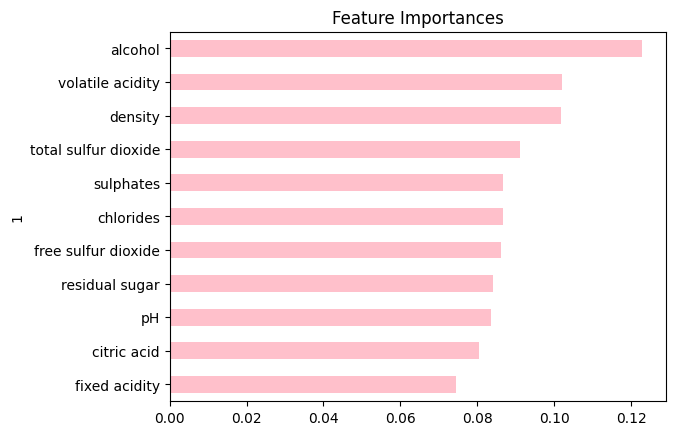

In [174]:
importances_df = pd.DataFrame(sorted(zip(rf_model.feature_importances_, feature_names), reverse=True))
importances_df.set_index(importances_df[1], inplace=True)
importances_df.drop(columns=1, inplace=True)
importances_df.rename(columns={0: 'Feature Importance'}, inplace=True)
importances_sorted = importances_df.sort_values(by='Feature Importance', ascending=True)
importances_sorted.plot(kind='barh', color='pink', title = 'Feature Importances', legend=False)